In [6]:
from bokeh.plotting import figure, output_notebook, show
output_notebook()

Loading BokehJS ...

Loading Bokeh python package to allow for visual interactivity.

In [7]:
import pandas as pd
import numpy as np
import datetime

# Read data 
df=pd.read_csv("C:/Users/Abhimanyu/Documents/911Calls.csv",
    header=0,names=['lat', 'lng','desc','zip','title','Category','timeStamp','twp','addr','e'],
    dtype={'lat':float,'lng':float,'desc':str,'zip':str,
                  'title':str,'Category':str,'timeStamp':str,'twp':str,'addr':str,'e':int}, 
     parse_dates=['timeStamp'])



df.tail()


,lat,lng,desc,zip,title,Category,timeStamp,twp,addr,e
97109,40.172314,-75.492728,RT422 & PERKIOMEN TRAIL UNDERPASS; UPPER PROV...,NaN,Traffic: VEHICLE ACCIDENT -,Traffic,2016-08-18 08:27:00,UPPER PROVIDENCE,RT422 & PERKIOMEN TRAIL UNDERPASS,1
97110,40.132601,-75.321467,MONTGOMERY AVE & DEKALB PIKE; EAST NORRITON; ...,19401,EMS: CARDIAC EMERGENCY,EMS,2016-08-18 08:32:00,EAST NORRITON,MONTGOMERY AVE & DEKALB PIKE,1
97111,40.264211,-75.274268,COWPATH RD & MOYER RD; HATFIELD TOWNSHIP; 2016...,19440,Traffic: VEHICLE ACCIDENT -,Traffic,2016-08-18 08:32:00,HATFIELD TOWNSHIP,COWPATH RD & MOYER RD,1
97112,40.083958,-75.385603,S GULPH RD & BILL SMITH BLVD; UPPER MERION; 20...,19406,Traffic: VEHICLE ACCIDENT -,Traffic,2016-08-18 08:32:00,UPPER MERION,S GULPH RD & BILL SMITH BLVD,1
97113,40.244886,-75.298744,S VALLEY FORGE RD & W MT VERNON ST; LANSDALE; ...,19446,Traffic: VEHICLE ACCIDENT -,Traffic,2016-08-18 08:32:00,LANSDALE,S VALLEY FORGE RD & W MT VERNON ST,1


Import Montogomery county Emergency 911 calls data from Kaggle: https://www.kaggle.com/mchirico/montcoalert. The data contains latitude and longitude information for for each of the calls, along with title of the call. Category is a derived column from the title column. There are three call categories: Fire, EMS, and Traffic. 

In [69]:
PA = x_range,y_range =((39, 41),(-76, -74.8))


plot_width  = int(750)
plot_height = int(plot_width//1.2)


def base_plot(tools='pan,wheel_zoom,reset',plot_width=plot_width, plot_height=plot_height, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range,outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p
    
options = dict(line_color=None, fill_color='blue', size=5)

Here we define some simple plot parameters. We first set the html canvas range for the state of PA. The define a base plot with certain interactive characteristics such as pan, zoom, and reset buttons. 

In [70]:
%%time
p = base_plot()

p.circle(x=df['lat'], y=df['lng'], **options)
show(p)

Wall time: 6.75 s


The above graph simply plots the latitude and logitudes of approximately 100,000 emergency calls. As we can see the chart does not give much information regarding the disribution of calls or any such meaningful info. It just shows up as a blob of blue dots. 

In [56]:
%%time
options = dict(line_color=None, fill_color='blue', size=2, alpha=0.1)
p = base_plot(webgl=True)
p.circle(x=df['lat'], y=df['lng'], **options)
show(p)

Wall time: 5.19 s


Here we specify tranparency parameter alpha, so that we can futher tease out the points. Now we can start seeing some shape in the data. The outline resembles Montgomery county,PA. Even though we can see the point seperation much more clearly than the prvious chart, we still see saturation of points, which don't help much in deeply understanding the structure and meaning from the dataset.

In [58]:
import datashader as ds 
from datashader import transfer_functions as tf
from datashader.colors import Greys9

Greys9_r = list(reversed(Greys9))[:-2]

Here we use a data visualization technique called, Datashading, that is applied in cases like this, where there are many points to plot, want to get meaningful insights, and concerned about the performace of the visual renderings. Other awesome examples of Datashadings can be found here: https://github.com/bokeh/datashader.

In [59]:
%%time
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height,x_range=x_range, y_range=y_range)
agg = cvs.points(df, 'lat', 'lng')
img = tf.shade(agg, cmap=["white", 'darkblue'], how='linear')

Wall time: 401 ms


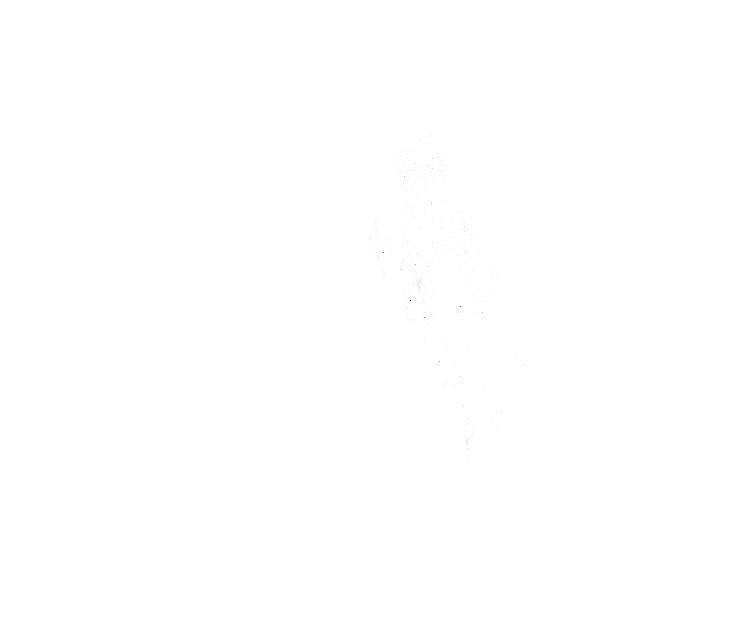

In [60]:
img

You can barely see the image above, but there is faint visual of the mapped emergency 911 calls. The above plot renders the count at every pixel as a color from white to blue , our specified range, and is mapped linearly. Since the display devices are not lineraly mapped, and the data is usually not evenly distributed, we need to apply some normalization techniques to tranform the data.

In [61]:
import numpy as np

def histogram(x,colors=None):
    hist,edges = np.histogram(x, bins=100)
    p = figure(y_axis_label="Pixels",
               tools='', height=130, outline_line_color=None,
               min_border=0, min_border_left=0, min_border_right=0,
               min_border_top=0, min_border_bottom=0)
    p.quad(top=hist[1:], bottom=0, left=edges[1:-1], right=edges[2:])
    print("min: {}, max: {}".format(np.min(x),np.max(x)))
    show(p)

In [28]:
histogram(agg.values)

min: 0, max: 1457


The histogram above shows the counts of pixels for the above image.

In [62]:
histogram(np.log1p(agg.values))

min: 0.0, max: 7.284820912568604


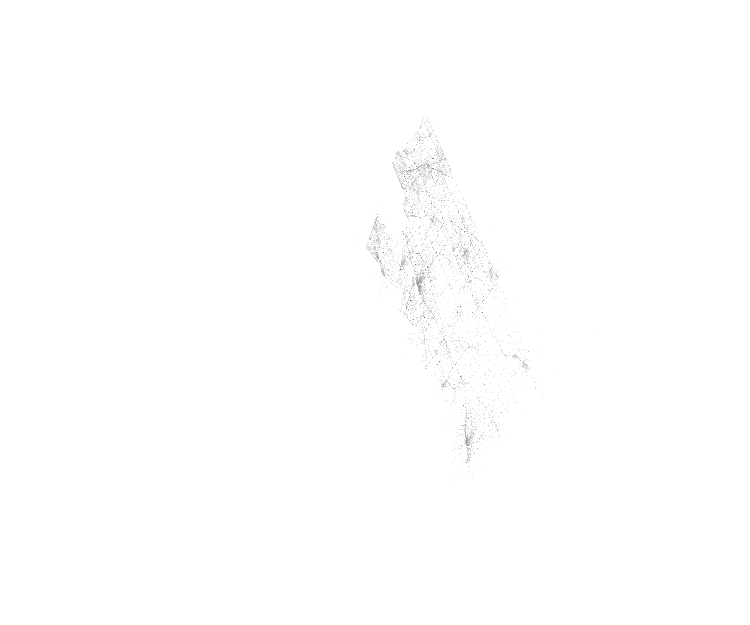

In [63]:
tf.shade(agg, cmap=Greys9_r, how='log')

The data above is transformed logistically and the image is rendered. 

min: 0.9807104, max: 1.0


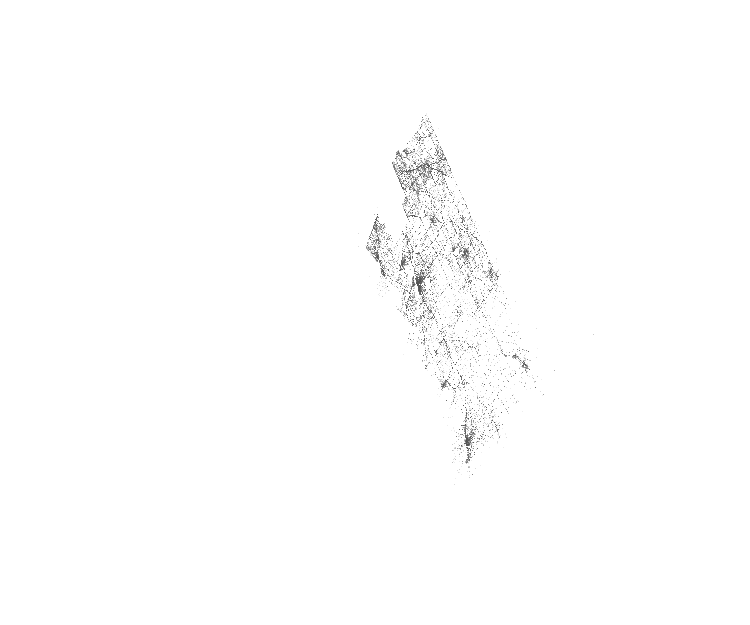

In [64]:
histogram(tf.eq_hist(agg.values))

tf.shade(agg, cmap=Greys9_r, how='eq_hist')


Equalizing the histogram reveals much better structure in the dataset as seen above. Now you start seeing some rendition of the streets and hotspots in the dataset.

In [65]:
import datashader as ds
from datashader.bokeh_ext import InteractiveImage
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno
from IPython.core.display import HTML, display

background = "black"
export = partial(export_image, export_path="export", background=background)
cm = partial(colormap_select, reverse=(background=="black"))

def create_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'lat', 'lng')
    img = tf.shade(agg, cmap=Hot, how='eq_hist')
    return tf.dynspread(img, threshold=0.3, max_px=4)


p = base_plot(background_fill_color=background)
export(create_image(*PA),"PA_hot")
InteractiveImage(p, create_image)

Plot above is interative. You can zoom, pan, and reset the plot for further exploration of the dataset. The color is a heatmap of the pixel densities at different bin levels, and the more saturated, the "hotter" the area. The above plot tells us that there are certain hotposts in the Montgormary County for Emergency 911 calls.

In [37]:
df.Category = df.Category.astype('category')

In [66]:
color_key = {'Traffic':'fuchsia', 'EMS':'lime',  'Fire':'seashell'}

def colorized_images(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df,'lat' , 'lng', ds.count_cat('Category'))
    img = tf.shade(agg, color_key=color_key)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
#p.add_tile(STAMEN_TERRAIN)
export(colorized_images(*PA),"Call Types")
InteractiveImage(p, colorized_images)

Now we add in a categorical variable, called Category, which tells the type of emergency call. The legend is as follows: Traffic related calls: fuchsia, EMS related calls: Lime, and Fire related calls: seashell white. Looking at the color distribution above, we can see that traffic related calls are distrubuted somewhat evenly, but there are couple clear hotspots for EMS related 911 calls. One fo the green hotspot is close to King of Prusia Mall, which is interesting and warrants further exploration. Fire related emergency calls are kinda hard to spot as those calls very sparse in the dataset. Overall, the more emergency calls related data we collect, the above graph will start showing even grater structure of the dataset, which will further help spot clear hotspots for possible interventions. Datashader is meant to applied on datasets are in order of millions of rows, so more data better the plot rendering. 